<a href="https://colab.research.google.com/github/travensolli/datascience/blob/master/Analisando_os_Dados_do_Airbnb_Dublin_(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<img alt="Colaboratory logo" width="15%" src="https://raw.githubusercontent.com/carlosfab/escola-data-science/master/img/novo_logo_bg_claro.png">

#### **Data Science na Prática 2.0**
*by [sigmoidal.ai](https://sigmoidal.ai)*

---

# Análise dos Dados do Airbnb - *Dublin*

Um dos pilares dos planos de uma boa viagem certamente é a hospedagem, e como todo bom viajante, a sua pesquisa sempre está regida por 3 fatores: **Localização**, **Preço** e **Conforto**. Mas onde realizar esta pesquisa? Bom, além daqueles sites de hotéis famosos pelos seus comerciais de TV há também o *martplace* chamado **Airbnb**.

O [Airbnb](https://www.airbnb.com.br/) é mais uma startup de sucesso e vem sendo considerada a **maior empresa hoteleira da atualidade** sem mesmo possuir um único hotel!

A proposta da plataforma é sem dúvidas inovadora, pois conecta viajantes à moradores locais que desejam alugar seus imóveis ou quartos e de quebra ganhar um dinheiro, são os chamados *anfitriões*.

Um recurso interessante para pesquisa de locais para se hospedar com Airbnb são os dados oferecidos por meio do portal [Inside Airbnb](http://insideairbnb.com/get-the-data.html), nele há dados das principais cidades turísticas do mundo! 

<center><img alt="Analisando Airbnb" width="50%" src="https://www.zilliondesigns.com/blog/wp-content/uploads/Airbnb-Logo-Contest.png"></center>
<center><img alt="Dublin Beer" width="50%" src="https://d1ynl4hb5mx7r8.cloudfront.net/wp-content/uploads/2016/02/25113159/West-Indies-and-Dublin-Porter1.jpg"></center>

**Neste *notebook*, serão analisados os dados referentes à cidade de Dublin, e ver quais insights podem ser extraídos a partir de dados brutos.**

## Obtenção dos Dados


In [ ]:
# importação de pacotes necessarios
import pandas as pd               
import matplotlib.pyplot as plt   
import seaborn as sns
%matplotlib inline

In [ ]:
#instalação e importação de pacote para exibição de mapas
!pip install folium;
import folium
from folium import plugins
from folium.plugins import HeatMap
basemaps = {
    'Google Maps': folium.TileLayer(
        tiles = 'https://mt1.google.com/vt/lyrs=m&x={x}&y={y}&z={z}',
        attr = 'Google',
        name = 'Google Maps',
        overlay = True,
        control = True
    ),
    'Google Satellite Hybrid': folium.TileLayer(
        tiles = 'https://mt1.google.com/vt/lyrs=y&x={x}&y={y}&z={z}',
        attr = 'Google',
        name = 'Google Satellite',
        overlay = True,
        control = True
    )
}

In [ ]:
# importação do arquivo listings.csv para um DataFrame
df=pd.read_csv("http://data.insideairbnb.com/ireland/leinster/dublin/2020-05-27/visualisations/listings.csv")


## Análise dos Dados

Vamos verificar a cara do nosso *dataset*, analisando as 5 primeiras entradas.

In [ ]:
# mostrar as 5 primeiras entradas
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,44077,cosy comfortable Irish cottage twin,193005,Teresa,NaN,Dn Laoghaire-Rathdown,53.28995,-6.25813,Private room,50,3,227,2020-03-06,2.03,3,52
1,85148,Habitación en Dublín Double room,466111,Don,NaN,South Dublin,53.30110,-6.31992,Private room,30,1,1,2019-05-11,0.08,1,208
2,85156,Cosy Comfortable Irish Cottage 1 Double Bed,193005,Teresa,NaN,Dn Laoghaire-Rathdown,53.29178,-6.25618,Private room,50,3,182,2020-03-09,1.66,3,156
3,121030,Comfy double room in central area 1,608225,Norah,NaN,Dublin City,53.33648,-6.22075,Private room,55,2,110,2019-03-19,1.01,3,116
4,159889,Friendly Single Room,766611,Margaret,NaN,Dublin City,53.39027,-6.23547,Private room,29,2,311,2020-02-09,3.12,3,299


A partir de uma breve análise podemos estruturar o **dicionario de variáveis** a seguir:

* **id** - número de identificação do imóvel
* **name** - nome do anúncio
* **host_id** - número de identificação do anfitrião
* **host_name** - nome do anfitrião
* **neighbourhood_group** - coluna sem valor válido
* **neighbourhood** - bairro
* **latitude** - coordenada de latitude do imóvel
* **longitude** - coordenada de longitude do imóvel	
* **room_type** - tipo do quarto disponibilizado
* **price** - preço de aluguel do imóvel
* **minimum_nights** - número mínimo de noites para reservar
* **number_of_reviews** - número de reviews do imóvel
* **last_review** - data do último review do imóvel
* **reviews_per_month** - número de reviews por mês do imóvel
* **calculated_host_listings_count** - quantidade de imóveis oferecidos pelo mesmo anfitrião
* **availability_365** - número de dias disponíveis no intervalo de um ano


Vamos procurar respostas para algumas perguntas que vão ajudar na análise...

### **Q1. Quantos atributos (variáveis) e quantas entradas o conjunto de dados possui? Quais os tipos das variáveis?**

In [ ]:
# identificar o volume de dados do DataFrame
print("Quantidade de registros:\t{}".format(df.shape[0]))
print("Quantidade de variáveis:\t{}\n".format(df.shape[1]))

# verificar os tipos de variáveis do dataset
display(df.dtypes)


Quantidade de registros:	8725
Quantidade de variáveis:	16



id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group               float64
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
dtype: object

**Variávies do tipo inteiro:**
* id
* host_id
* price
* minimum_nights
* number_of_reviews
* calculated_host_listings_count
* availability_365
    
**Variávies do tipo ponto flutuante:**
* neighbourhood_group
* latitude
* longitude
* reviews_per_month
       
**Variávies do tipo texto:**
* name
* host_name
* neighbourhood
* room_type
* last_review

### **Q2. Qual a porcentagem de valores ausentes no *dataset*?**

In [ ]:
# ordenar em ordem decrescente as variáveis por seus valores ausentes
(df.isnull().sum() / df.shape[0]).sort_values(ascending=False)*100

neighbourhood_group               100.000000
reviews_per_month                  16.859599
last_review                        16.859599
name                                0.011461
availability_365                    0.000000
calculated_host_listings_count      0.000000
number_of_reviews                   0.000000
minimum_nights                      0.000000
price                               0.000000
room_type                           0.000000
longitude                           0.000000
latitude                            0.000000
neighbourhood                       0.000000
host_name                           0.000000
host_id                             0.000000
id                                  0.000000
dtype: float64

Nota-se que:
* A coluna **neighbourhood_group** é nula;
* Aproximadamente 17% dos registros não há review;
* Cerca de 0.01% das hospedagens não possuem um nome de anúncio.

### **Q3. Qual o tipo de distribuição das variáveis?** 

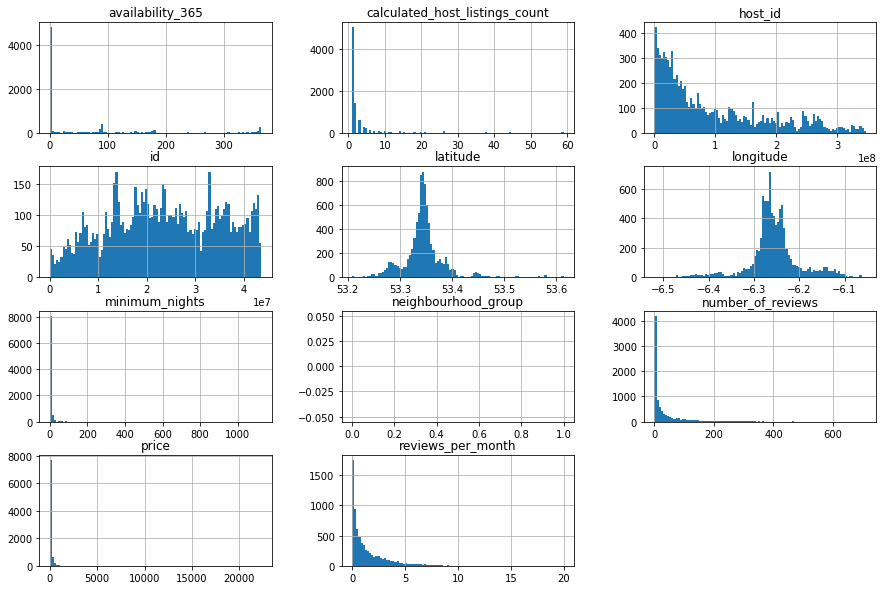

In [ ]:
# plotar o histograma das variáveis numéricas
df.hist(bins=100, figsize=(15,10));

O gráfico de Histograma nos permite visualizar a distribuição de valores e dos também conhecidos ***pontos fora da curva***. As variáveis **minimum_nights** e **price** possuem esses pontos, prejudicando a visualização da distribuição mais próxima da realidade.

 ### **Q4. Há outliers presentes?** 
 Pela distribuição do histograma, é possível verificar indícios da presença de outliers. Como dito acima há outliers nas variáveis **price** e **minimum_nights**.

Os valores não seguem uma distribuição, e distorcem toda a representação gráfica. Para confirmar, existem duas maneiras rápidas que auxiliam a detecção de *outliers*. São elas:
<ol>
<li>Resumo estatístico por meio do método describe()</li>
<li>Plotar boxplots para a variável.</li>
</ol>

**Resumo estatístico por meio do método describe()**

In [ ]:
# ver o resumo estatístico das variáveis numéricas
df[['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month',
    'calculated_host_listings_count', 'availability_365']].describe()

,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,8725.000000,8725.000000,8725.000000,7254.000000,8725.000000,8725.000000
mean,138.554842,4.448138,36.498109,1.443226,3.654212,74.146246
std,353.363599,21.171788,65.127700,1.771498,7.350121,111.795187
min,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,55.000000,1.000000,1.000000,0.220000,1.000000,0.000000
50%,89.000000,2.000000,9.000000,0.740000,1.000000,0.000000
75%,150.000000,3.000000,39.000000,2.050000,3.000000,112.000000
max,22337.000000,1125.000000,710.000000,19.970000,59.000000,365.000000


Uma rápida interpretação do resumo estatístico acima, podemos confirmar algumas hipóteses como:

* 75% dos imóveis tem preço (**price**) de hospedagem abaixo de 150€, porém seu valor máximo é 22337€.
* 75% dos anfitriões exigem de 1 a 3 noites mínimas de estadia (**minimum_nights**).
* Outra observação interessante é que 75% dos anfitriões (**calculated_host_listings_count**) possuem de 1 a 3 imóveis anunciados  e existe um número máximo de 59.

Vamos plotar bloxplot para o preço e quantidade mínima de noites para ver melhor esses dados.

**Boxplot para price**

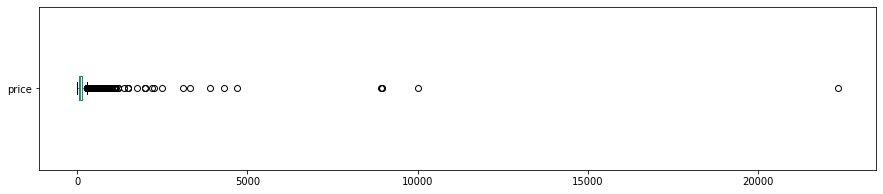

Quantidade de valores acima de: 800
104 entradas
1.1920% dos registros


In [ ]:
# price
df.price.plot(kind='box', vert=False, figsize=(15, 3),)
plt.show()
val_p=800
# ver quantidade de valores acima de 1000 para price
print("Quantidade de valores acima de: {}".format(val_p))
print("{} entradas".format(len(df[df.price > val_p])))
print("{:.4f}% dos registros".format((len(df[df.price > val_p]) / df.shape[0])*100))



Os preços acima de 800€ não chegam nem a 2% do total dos 8725 registros.

**Boxplot para price até 800€**

Limitando a valores até 800€ o bloxplot dará uma noção melhor.

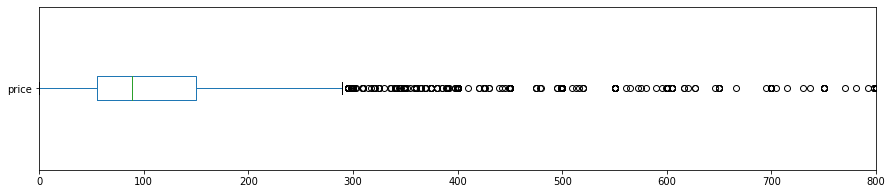

In [ ]:
df.price.plot(kind='box', vert=False, xlim=(0,val_p), figsize=(15,3));

Veja que boa parte dos imóveis estão na faixa de até 300€, acima disso é abusivo ou luxo demais.

**Boxplot para price até 300€**

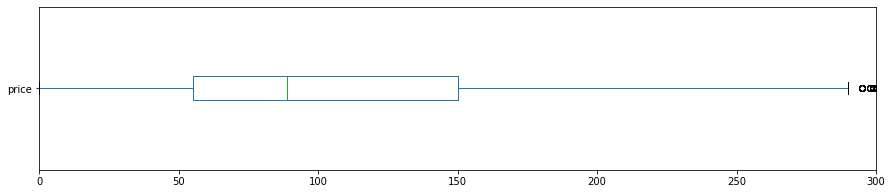

In [ ]:
val_p=300
df.price.plot(kind='box', vert=False, xlim=(0,val_p), figsize=(15,3));

Eliminando os outliers de **price** podemos confirmar o resumo estatístico de que 75% dos imóveis possuem preço abaixo de 150€.

**Boxplot para minimum_nights**

Vamos verificar quantos imóveis possuem quantidade mínima de noites de estadia acima de 30. Afinal, o objetivo é viagem e não moradia.

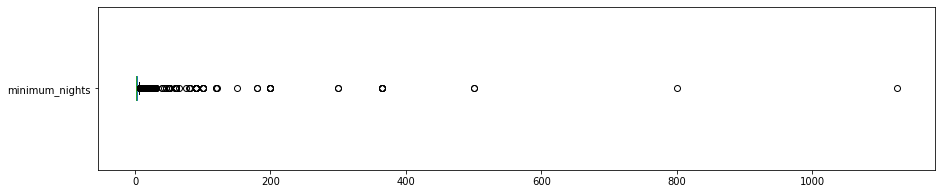

minimum_nights: valores acima de 30:
72 entradas
0.8252%


In [ ]:
# minimum_nights
df.minimum_nights.plot(kind='box', vert=False, figsize=(15, 3))
plt.show()
val_n=30
# ver quantidade de valores acima de 30 dias para minimum_nights
print("minimum_nights: valores acima de 30:")
print("{} entradas".format(len(df[df.minimum_nights > val_n])))
print("{:.4f}%".format((len(df[df.minimum_nights > val_n]) / df.shape[0])*100))

Não chega a 1% a quantidade de anfitriões que exigem uma estadia mínima de 30 noites.

**Boxplot para minimum_nights até 30 noites**

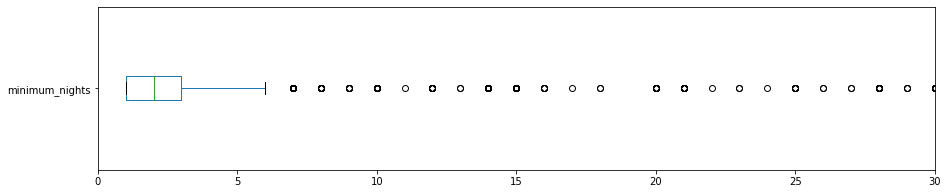

In [ ]:
df.minimum_nights.plot(kind='box', vert=False,xlim=(0,val_n), figsize=(15, 3))

Apesar de a minoria exigir pelo menos 10 noites é interessante manter estes anúncios pela oportunidade de conseguir mais que uma semana por um bom custo-benefício.

**Histogramas sem *outliers***

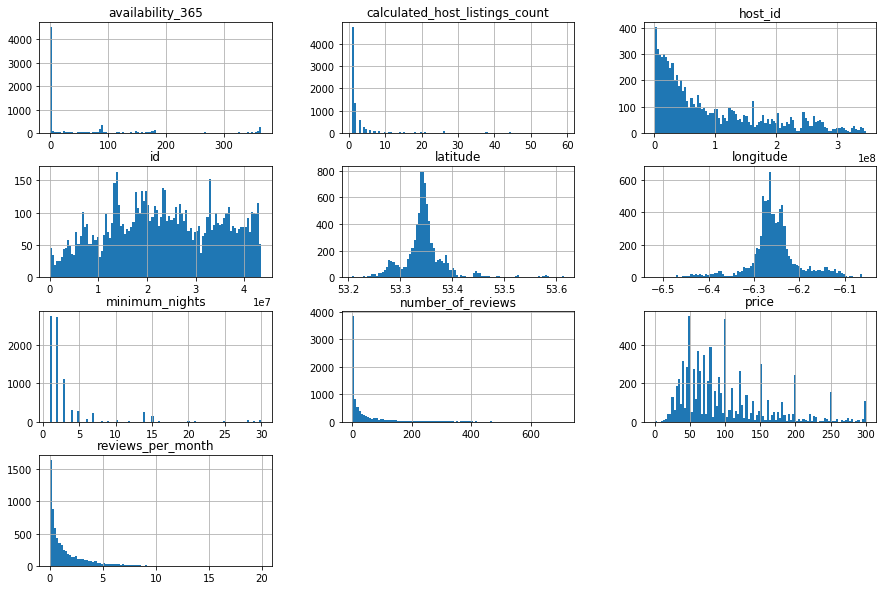

In [ ]:
# remover os *outliers* em um novo DataFrame
df_clean = df.copy()
df_clean.drop(df_clean[df_clean.price > val_p].index, axis=0, inplace=True) #removendo outliers de price
df_clean.drop(df_clean[df_clean.minimum_nights > val_n].index, axis=0, inplace=True) #removendo outliers de price

# remover `neighbourhood_group`, pois está vazio
df_clean.drop('neighbourhood_group', axis=1, inplace=True)

# plotar o histograma para as variáveis numéricas
df_clean.hist(bins=100, figsize=(15,10));

Com os dados discrepantes eliminados, nota-se os valores *arredondados* de **price**, de 50€ em 50€, sendo que imóveis com valores de 50€ e 100€ são mais de 800€!
Pode ficar tranquilo que não faltaram opções com preços acessíveis.

### **Q4. Qual a correlação existente entre as variáveis**

A correlação é um coeficiente de relação linear entre duas variáveis de qualquer valor entre -1 a 1, indicando o grau de dependência entre elas. Quanto mais próximo de 0, mais fraca a correlação entre as variáveis. Quando mais próximo de -1 ou +1, mais forte a correlação entre as variáveis.

In [ ]:
# criar uma matriz de correlação
corr = df_clean[['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month','calculated_host_listings_count', 'availability_365']].corr()

# mostrar a matriz de correlação
display(corr)

,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
price,1.000000,0.074265,-0.046462,-0.060880,0.066713,0.036025
minimum_nights,0.074265,1.000000,-0.029663,-0.045385,0.096945,0.054350
number_of_reviews,-0.046462,-0.029663,1.000000,0.811222,-0.024604,0.178135
reviews_per_month,-0.060880,-0.045385,0.811222,1.000000,0.021463,0.185301
calculated_host_listings_count,0.066713,0.096945,-0.024604,0.021463,1.000000,0.138703
availability_365,0.036025,0.054350,0.178135,0.185301,0.138703,1.000000


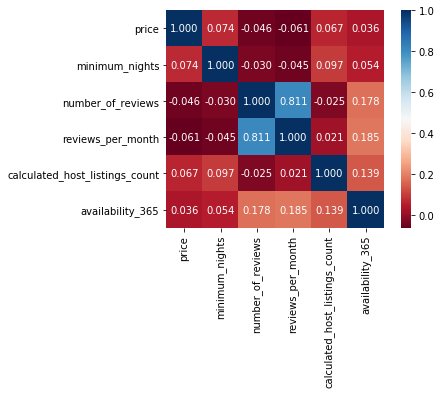

In [ ]:
# plotar um heatmap a partir das correlações
sns.heatmap(corr, cmap='RdBu', fmt='.3f', square=True, linecolor='white', annot=True);

A matriz de correlação e a representação gráfica nos permite ver que parte das correlaçoes são fracas, mas podemos destacar as variáveis **number_of_reviews** e **reviews_per_month**.
Os números de reviews se explicam por lógica onde quanto maior **number_of_reviews** maior será a quantidade de reviews mensal naquele anúncio.


### **Q5. Qual o tipo de imóvel mais alugado no Airbnb?**

In [ ]:
# mostrar a quantidade de cada tipo de imóvel disponível
df_clean.room_type.value_counts()

Private room       4112
Entire home/apt    3776
Shared room         138
Hotel room           59
Name: room_type, dtype: int64

In [ ]:
# mostrar a porcentagem de cada tipo de imóvel disponível
df_clean.room_type.value_counts() / df_clean.shape[0]*100

Private room       50.859617
Entire home/apt    46.703772
Shared room         1.706865
Hotel room          0.729746
Name: room_type, dtype: float64

Praticamente metade se divide entre quartos privativos e casa/apartamentos inteiros. Ótimo pra quem procura conforto e privacidade, se sentindo realmente em casa.

### **Q6. Qual a localidade mais cara do dataset?**



In [ ]:
# ver preços por bairros, na média
df_clean.groupby(['neighbourhood']).price.mean().sort_values(ascending=False)[:10]

neighbourhood
Dublin City              102.171186
Dn Laoghaire-Rathdown    100.004489
Fingal                    80.687332
South Dublin              72.927273
Name: price, dtype: float64

Como esperado, na média de valores de **price** até 300€, a região central de Dublin possui as hospedagems mais caras, acompanhada da região sul Dn Laoghaire-Rathdown. Mas se observarmos estes valores próximos de 100€ do máximo de 300€. O gráfico a seguir trará uma noção melhor da distribuição de preços na cidade.

Valor médio em toda a cidade: 98.77€


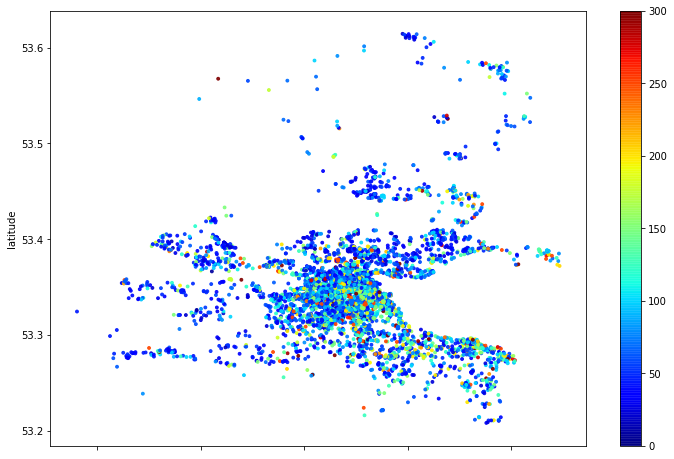

In [ ]:
# plotar os imóveis pela latitude-longitude
df_clean.plot(kind="scatter", x='longitude', y='latitude', alpha=0.9, c=df_clean['price'], s=8,
              cmap=plt.get_cmap('jet'), figsize=(12,8));

#média de preços
print("Valor médio em toda a cidade: {:.2f}€".format(df_clean.price.mean()))

Há preços para todos os bolsos, mas para ajudar nos planos de uma viagem, podemos utilizar como parâmetro o número médio de 98.77€. Mas falta entender para quantas noites é este valor.


### **Q7. Qual é a média do mínimo de noites para aluguel (minimum_nights)?**

In [ ]:
# ver preços por bairros, na média
df_clean.groupby(['neighbourhood']).minimum_nights.mean().sort_values(ascending=False)[:20]

neighbourhood
Dn Laoghaire-Rathdown    3.616725
Dublin City              3.197610
South Dublin             2.703704
Fingal                   2.392906
Name: minimum_nights, dtype: float64

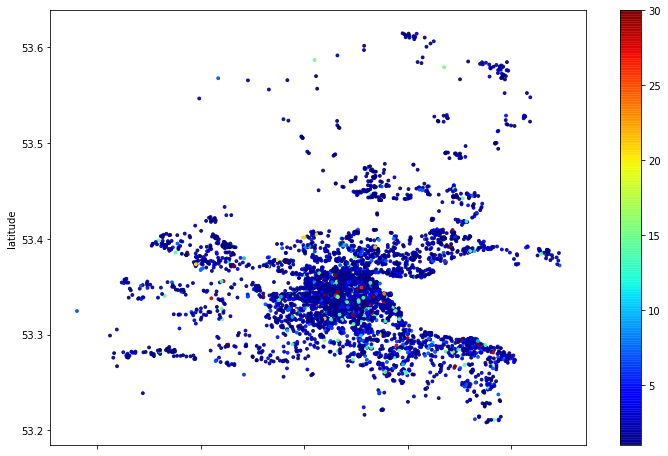

In [ ]:
# plotar os imóveis pela latitude-longitude
df_clean.plot(kind="scatter", x='longitude', y='latitude', alpha=0.9, c=df_clean['minimum_nights'], s=8,
              cmap=plt.get_cmap('jet'), figsize=(12,8))

In [ ]:
# ver a média da coluna `minimum_nights``
print("Valor médio de noites mínimas em toda a cidade: {:.0f}".format(df_clean.minimum_nights.mean()))

Valor médio de noites mínimas em toda a cidade: 3


Arrendondado valores, o viajante pode entender que gastará 100€ por 3 noites em Dublin, ou seja, cerca de 33€ por noite.

Um simples gráfico dos pontos de latitude e longitude pode trazer a noção dos locais acunciados. Vamos utilizar a bibilioteca ***folium*** para visualizar em mapa estas hospedagens, isto possibilita escolher o melhor custo *versus* localização.


### **Mapa de Calor**

In [ ]:
# Define our key point when map open it
map2 = folium.Map(location=[53.4, df_clean.longitude.mean()],control_scale = True)
basemaps['Google Satellite Hybrid'].add_to(map2)
basemaps['Google Maps'].add_to(map2)
# List comprehension to make out list of lists
heat_data = [[row['latitude'],row['longitude']] for index, row in df_clean.iterrows()]
HeatMap(heat_data,blur=20,radius=20,name='Heat Map').add_to(map2)

# Add a layer control panel to the map.
folium.LayerControl().add_to(map2)

# Display the map.
display(map2)

In [ ]:
for la,lo,pp,price_pp,nights_pp in zip(df_clean.latitude[0:len(df_clean.latitude)],df_clean.longitude[0:len(df_clean.longitude)],
                                        df_clean.room_type[0:len(df_clean.room_type)],
                                        df_clean.price[0:len(df_clean.price)],
                                        df_clean.minimum_nights[0:len(df_clean.minimum_nights)]):
    if price_pp <=50:
      folium.Circle(
        location=[la,lo],
        radius=0,
        popup=folium.Popup(html="<ul><li>Room Type: "+pp+"</li> <li>Price: "+str(price_pp)+"</li><li>Minimum nights: "+str(nights_pp)+"</li></ul>",
                          max_width=500),
        fill=True,
        color='green',
        fill_color='green'
        ).add_to(map2)
    elif (price_pp>50 and price_pp <=150):
      folium.Circle(
        location=[la,lo],
        radius=0,
        popup=folium.Popup(html="<ul><li>Room Type: "+pp+"</li> <li>Price: "+str(price_pp)+"</li><li>Minimum nights: "+str(nights_pp)+"</li></ul>",
                          max_width=500),
        fill=True,
        color='yellow',
        fill_color='yellow'
        ).add_to(map2)
    else:
      folium.Circle(
        location=[la,lo],
        radius=0,
        popup=folium.Popup(html="<ul><li>Room Type: "+pp+"</li> <li>Price: "+str(price_pp)+"</li><li>Minimum nights: "+str(nights_pp)+"</li></ul>",
                          max_width=500),
        fill=True,
        color='red',
        fill_color='red'
      ).add_to(map2)

# Display the map.
display(map2)

## Conclusões
